In [1]:
import os
import pandas as pd
from pandasgui import show
import numpy as np
from fancyimpute import IterativeImputer
from datetime import datetime
import missingno as msno
import matplotlib.pyplot as plt
import plotly.graph_objects as go
%matplotlib inline

In [96]:
# ## 6-1<Function to merge noise_weather dataset with Export40. Create a new folder in the Export40 directory then save the merged files>

# def generate_new_file(file_path_1, file_path_2):
    
#     import os
#     import pandas as pd
#     from datetime import datetime
    
#     file_list_1 = []
#     for file1 in os.listdir(file_path_1):
#         file_list_1.append(os.path.join(file_path_1, file1))
#     print(file_list_1)
    
#     file_list_2 = []
#     for file2 in os.listdir(file_path_2):
#         file_list_2.append(os.path.join(file_path_2, file2))
#     print(file_list_2)
    
#     merged_folder = os.path.join(file_path_2, 'merged')  # New folder path
#     os.makedirs(merged_folder, exist_ok=True)  # Create the 'merged' folder if it doesn't exist
    
#     for i, file1 in enumerate(file_list_1):
#         # Read File1.
#         df1 = pd.read_csv(file1)
#         df1['description'] = df1['description'].fillna(df1['description'].dropna().iloc[0])
#         new_df = df1.groupby([
#             df1['description'],
#             df1['year'],
#             df1['month'],        
#             df1['day'],
#             df1['weekday'],
#             df1['hour']])[['mean_lamax', 'mean_laeq', 'mean_lceq', 'mean_lcpeak',
#                 'LC_HUMIDITY', 'LC_DWPTEMP', 'LC_n', 'LC_RAD', 'LC_RAININ',
#                 'LC_DAILYRAIN', 'LC_WINDDIR', 'LC_WINDSPEED', 'LC_RAD60',
#                 'LC_TEMP_QCL0', 'LC_TEMP_QCL1', 'LC_TEMP_QCL2', 'LC_TEMP_QCL3']].mean().reset_index()
    
#         # Rename the columns
#         new_df.columns = ['description', 'year', 'month', 'day', 'weekday', 'hour', 
#                             'mean_lamax', 'mean_laeq', 'mean_lceq', 'mean_lcpeak',
#                             'LC_HUMIDITY', 'LC_DWPTEMP', 'LC_n', 'LC_RAD', 'LC_RAININ',
#                             'LC_DAILYRAIN', 'LC_WINDDIR', 'LC_WINDSPEED', 'LC_RAD60',
#                             'LC_TEMP_QCL0', 'LC_TEMP_QCL1', 'LC_TEMP_QCL2', 'LC_TEMP_QCL3']
#         new_df['timestamp'] = pd.to_datetime(new_df[['year', 'month', 'day', 'hour']]).dt.floor('H')
#         for j, file2 in enumerate(file_list_2):
#             if i != j:
#                 continue  # Skip if i and j are not equal
            
#             # Read File2.
#             df2 = pd.read_csv(file2, delimiter=';')
#             df2['result_timestamp'] = pd.to_datetime(df2['result_timestamp'], format='%d/%m/%Y %H:%M:%S.%f')
#             # Create new columns for year, month, day, hour
#             df2['year'] = df2['result_timestamp'].dt.year
#             df2['month'] = df2['result_timestamp'].dt.month
#             df2['day'] = df2['result_timestamp'].dt.day
#             df2['hour'] = df2['result_timestamp'].dt.hour
            
#             merged_df = pd.merge(new_df, df2, how='outer', on=['year', 'month', 'day', 'hour'])
#             # Create the 'datetime' column
            

#             # Construct the new file path within the 'merged' folder
#             file_name = os.path.basename(file2)
#             new_file_path = os.path.join(merged_folder, file_name[:-4]+'_hour.csv')
#             merged_df.to_csv(new_file_path, index=False)

In [34]:
## 6-1-1 <Function to merge noise_weather dataset with Export40. Create a new folder in the Export40 directory then save the merged files>
## With Latitude and Longitude, missingness filled with zero

def generate_new_file(file_path_1, file_path_2):
    import os
    import pandas as pd
    from datetime import datetime
    from sklearn.preprocessing import MinMaxScaler

    file_list_1 = []
    for file1 in os.listdir(file_path_1):
        file_list_1.append(os.path.join(file_path_1, file1))
    print(file_list_1)

    file_list_2 = []
    for file2 in os.listdir(file_path_2):
        file_list_2.append(os.path.join(file_path_2, file2))
    print(file_list_2)

    merged_folder = os.path.join(file_path_2, 'merged')  # New folder path
    os.makedirs(merged_folder, exist_ok=True)  # Create the 'merged' folder if it doesn't exist

    latitudes = [50.8746732340347, 50.877281421991, 50.8766152149678, 50.8759720781178,
                 50.87537632238, 50.8740221728061, 50.8742615346091, 50.8795892553586]
    longitudes = [4.69991643113481, 4.70068719734466, 4.70072154049763, 4.70023874289325,
                  4.70002416618018, 4.70014402410815, 4.70000746832415, 4.70120106513623]
    data_number =['data0_03','data0_08','data0_07','data0_06','data0_05','data0_01','data0_02','data0_04']
    address =['Calvariekapel_KUL','Naamsestraat_35_Maxim','Naamsestraat_57_Xior','Naamsestraat_62_Taste',
              'Naamsestraat_76_His-Hears','Naamsestraat_81','Parkstraat_2_La-Filosovia','Vrijthof']

    for i, file1 in enumerate(file_list_1):
        # Read File1.
        df1 = pd.read_csv(file1)
        df1['description'] = df1['description'].fillna(df1['description'].dropna().iloc[0])
        new_df = df1.groupby([
            df1['description'],
            df1['year'],
            df1['month'],
            df1['day'],
            df1['weekday'],
            df1['hour']])[['mean_lamax', 'mean_laeq', 'mean_lceq', 'mean_lcpeak',
                          'LC_HUMIDITY', 'LC_DWPTEMP', 'LC_n', 'LC_RAD', 'LC_RAININ',
                          'LC_DAILYRAIN', 'LC_WINDDIR', 'LC_WINDSPEED', 'LC_RAD60',
                          'LC_TEMP_QCL0', 'LC_TEMP_QCL1', 'LC_TEMP_QCL2', 'LC_TEMP_QCL3']].mean().reset_index()

        # Rename the columns
        new_df.columns = ['description', 'year', 'month', 'day', 'weekday', 'hour',
                          'mean_lamax', 'mean_laeq', 'mean_lceq', 'mean_lcpeak',
                          'LC_HUMIDITY', 'LC_DWPTEMP', 'LC_n', 'LC_RAD', 'LC_RAININ',
                          'LC_DAILYRAIN', 'LC_WINDDIR', 'LC_WINDSPEED', 'LC_RAD60',
                          'LC_TEMP_QCL0', 'LC_TEMP_QCL1', 'LC_TEMP_QCL2', 'LC_TEMP_QCL3']
        new_df['timestamp'] = pd.to_datetime(new_df[['year', 'month', 'day', 'hour']]).dt.floor('H')

        for j, file2 in enumerate(file_list_2):
            if i != j:
                continue  # Skip if i and j are not equal

            # Read File2.
            df2 = pd.read_csv(file2, delimiter=';')

            df2['result_timestamp'] = pd.to_datetime(df2['result_timestamp'], format='%d/%m/%Y %H:%M:%S.%f')
            # Create new columns for year, month, day, hour
            df2['year'] = df2['result_timestamp'].dt.year
            df2['month'] = df2['result_timestamp'].dt.month
            df2['day'] = df2['result_timestamp'].dt.day
            df2['hour'] = df2['result_timestamp'].dt.hour



            merged_df = pd.merge(new_df, df2, how='outer', on=['year', 'month', 'day', 'hour'])
            # Create the 'datetime' column
            # Columns to scale
            columns_to_scale = ['laf005_per_hour', 'laf01_per_hour', 'laf05_per_hour', 'laf10_per_hour',
                                'laf25_per_hour', 'laf50_per_hour', 'laf75_per_hour', 'laf90_per_hour',
                                'laf95_per_hour', 'laf98_per_hour', 'laf99_per_hour', 'laf995_per_hour']
            # Scale the values
            scaler = MinMaxScaler()
            merged_df[columns_to_scale] = scaler.fit_transform(merged_df[columns_to_scale])

            # Add latitude, longitude and data_number values to merged file
            merged_df['latitude'] = latitudes[j]
            merged_df['longitude'] = longitudes[j]
            merged_df['data_number'] = data_number[j]
            merged_df['description_x'] = address[j]
            merged_df = merged_df.rename(columns={'description_x': 'location'})
            
            # Fill blank cells with 0
            merged_df = merged_df.fillna(0)
            
            # Construct the new file path within the 'merged' folder
            file_name = os.path.basename(file2)
            new_file_path = os.path.join(merged_folder, file_name[:-4]+'_hour.csv')
            merged_df.to_csv(new_file_path, index=False)

In [28]:
## 6-1-2 <Function to merge noise_weather dataset with Export40. Create a new folder in the Export40 directory then save the merged files>
## With Latitude and Longitude, drop missingness

def generate_new_file(file_path_1, file_path_2):
    import os
    import pandas as pd
    from datetime import datetime
    from sklearn.preprocessing import MinMaxScaler

    file_list_1 = []
    for file1 in os.listdir(file_path_1):
        file_list_1.append(os.path.join(file_path_1, file1))
    print(file_list_1)

    file_list_2 = []
    for file2 in os.listdir(file_path_2):
        file_list_2.append(os.path.join(file_path_2, file2))
    print(file_list_2)

    merged_folder = os.path.join(file_path_2, 'merged')  # New folder path
    os.makedirs(merged_folder, exist_ok=True)  # Create the 'merged' folder if it doesn't exist

    latitudes = [50.8746732340347, 50.877281421991, 50.8766152149678, 50.8759720781178,
                 50.87537632238, 50.8740221728061, 50.8742615346091, 50.8795892553586]
    longitudes = [4.69991643113481, 4.70068719734466, 4.70072154049763, 4.70023874289325,
                  4.70002416618018, 4.70014402410815, 4.70000746832415, 4.70120106513623]
    data_number =['data0_03','data0_08','data0_07','data0_06','data0_05','data0_01','data0_02','data0_04']
    address =['Calvariekapel_KUL','Naamsestraat_35_Maxim','Naamsestraat_57_Xior','Naamsestraat_62_Taste',
              'Naamsestraat_76_His-Hears','Naamsestraat_81','Parkstraat_2_La-Filosovia','Vrijthof']

    for i, file1 in enumerate(file_list_1):
        # Read File1.
        df1 = pd.read_csv(file1)
        df1['description'] = df1['description'].fillna(df1['description'].dropna().iloc[0])
        new_df = df1.groupby([
            df1['description'],
            df1['year'],
            df1['month'],
            df1['day'],
            df1['weekday'],
            df1['hour']])[['mean_lamax', 'mean_laeq', 'mean_lceq', 'mean_lcpeak',
                          'LC_HUMIDITY', 'LC_DWPTEMP', 'LC_n', 'LC_RAD', 'LC_RAININ',
                          'LC_DAILYRAIN', 'LC_WINDDIR', 'LC_WINDSPEED', 'LC_RAD60',
                          'LC_TEMP_QCL0', 'LC_TEMP_QCL1', 'LC_TEMP_QCL2', 'LC_TEMP_QCL3']].mean().reset_index()

        # Rename the columns
        new_df.columns = ['description', 'year', 'month', 'day', 'weekday', 'hour',
                          'mean_lamax', 'mean_laeq', 'mean_lceq', 'mean_lcpeak',
                          'LC_HUMIDITY', 'LC_DWPTEMP', 'LC_n', 'LC_RAD', 'LC_RAININ',
                          'LC_DAILYRAIN', 'LC_WINDDIR', 'LC_WINDSPEED', 'LC_RAD60',
                          'LC_TEMP_QCL0', 'LC_TEMP_QCL1', 'LC_TEMP_QCL2', 'LC_TEMP_QCL3']
        new_df['timestamp'] = pd.to_datetime(new_df[['year', 'month', 'day', 'hour']]).dt.floor('H')

        for j, file2 in enumerate(file_list_2):
            if i != j:
                continue  # Skip if i and j are not equal

            # Read File2.
            df2 = pd.read_csv(file2, delimiter=';')

            df2['result_timestamp'] = pd.to_datetime(df2['result_timestamp'], format='%d/%m/%Y %H:%M:%S.%f')
            # Create new columns for year, month, day, hour
            df2['year'] = df2['result_timestamp'].dt.year
            df2['month'] = df2['result_timestamp'].dt.month
            df2['day'] = df2['result_timestamp'].dt.day
            df2['hour'] = df2['result_timestamp'].dt.hour



            merged_df = pd.merge(new_df, df2, how='outer', on=['year', 'month', 'day', 'hour'])
            # Create the 'datetime' column
            # Columns to scale
            columns_to_scale = ['laf005_per_hour', 'laf01_per_hour', 'laf05_per_hour', 'laf10_per_hour',
                                'laf25_per_hour', 'laf50_per_hour', 'laf75_per_hour', 'laf90_per_hour',
                                'laf95_per_hour', 'laf98_per_hour', 'laf99_per_hour', 'laf995_per_hour']
            # Scale the values
            scaler = MinMaxScaler()
            merged_df[columns_to_scale] = scaler.fit_transform(merged_df[columns_to_scale])

            # Add latitude, longitude and data_number values to merged file
            merged_df['latitude'] = latitudes[j]
            merged_df['longitude'] = longitudes[j]
            merged_df['data_number'] = data_number[j]
            merged_df['description_x'] = address[j]
            merged_df = merged_df.rename(columns={'description_x': 'location'})
            
            # Fill blank cells with 0
            merged_df = merged_df.dropna()
            
            # Construct the new file path within the 'merged' folder
            file_name = os.path.basename(file2)
            new_file_path = os.path.join(merged_folder, file_name[:-4]+'_hour.csv')
            merged_df.to_csv(new_file_path, index=False)

In [35]:
# 6-1 Example usage
file_path_1 = r'C:\Users\LIE\MDA Project\Sound in Street\8_Sites of noise imputed with weather ref'
file_path_2 = r'C:\Users\LIE\MDA Project\Sound in Street\export_40'
generate_new_file(file_path_1, file_path_2)

['C:\\Users\\LIE\\MDA Project\\Sound in Street\\8_Sites of noise imputed with weather ref\\calvariekapel_Cancatenated_File_Timestamp_new_weather_imputed.csv', 'C:\\Users\\LIE\\MDA Project\\Sound in Street\\8_Sites of noise imputed with weather ref\\naam35_Cancatenated_File_Timestamp_new_weather_imputed.csv', 'C:\\Users\\LIE\\MDA Project\\Sound in Street\\8_Sites of noise imputed with weather ref\\naam57_Cancatenated_File_Timestamp_new_weather_imputed.csv', 'C:\\Users\\LIE\\MDA Project\\Sound in Street\\8_Sites of noise imputed with weather ref\\naam62_Cancatenated_File_Timestamp_new_weather_imputed.csv', 'C:\\Users\\LIE\\MDA Project\\Sound in Street\\8_Sites of noise imputed with weather ref\\naam76_Cancatenated_File_Timestamp_new_weather_imputed.csv', 'C:\\Users\\LIE\\MDA Project\\Sound in Street\\8_Sites of noise imputed with weather ref\\naam81_Cancatenated_File_Timestamp_new_weather_imputed.csv', 'C:\\Users\\LIE\\MDA Project\\Sound in Street\\8_Sites of noise imputed with weather r

C:\Users\LIE\AppData\Local\Temp\ipykernel_21176\3276262356.py:33: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  df1 = pd.read_csv(file1)


In [26]:
## 6-1-2<Function to Concatenate All Percentile, Noise, and Weather Data
## With Latitude and Longitude

def concatenate_files(file_path_1):
    import os
    import pandas as pd

    file_list_1 = []
    for file1 in os.listdir(file_path_1):
        file_list_1.append(os.path.join(file_path_1, file1))
    print(file_list_1)

    concatenated_folder = os.path.join(file_path_1, 'concatenated')  # New folder path
    os.makedirs(concatenated_folder, exist_ok=True)  # Create the concatenated' folder if it doesn't exist

    concatenated_df = pd.DataFrame()
    for file in file_list_1:    
        df = pd.read_csv(file)
        concatenated_df = pd.concat([concatenated_df, df])
    # Export merged_df
    file_name = os.path.basename(file)
    new_file_path = os.path.join(concatenated_folder, file_name[:-4]+'_concatenated.csv')
    concatenated_df.to_csv(new_file_path, index=False)

In [36]:
# 6-1-2 Example usage
file_path_1 = r'C:\Users\LIE\MDA Project\Sound in Street\export_40\merged'
concatenate_files(file_path_1)

['C:\\Users\\LIE\\MDA Project\\Sound in Street\\export_40\\merged\\calvariekapel-_results_40_hour.csv', 'C:\\Users\\LIE\\MDA Project\\Sound in Street\\export_40\\merged\\naamsestraat-35_results_40_hour.csv', 'C:\\Users\\LIE\\MDA Project\\Sound in Street\\export_40\\merged\\naamsestraat-57_results_40_hour.csv', 'C:\\Users\\LIE\\MDA Project\\Sound in Street\\export_40\\merged\\naamsestraat-62_results_40_hour.csv', 'C:\\Users\\LIE\\MDA Project\\Sound in Street\\export_40\\merged\\naamsestraat-76_results_40_hour.csv', 'C:\\Users\\LIE\\MDA Project\\Sound in Street\\export_40\\merged\\naamsestraat-81_results_40_hour.csv', 'C:\\Users\\LIE\\MDA Project\\Sound in Street\\export_40\\merged\\parkstraat-2_results_40_hour.csv', 'C:\\Users\\LIE\\MDA Project\\Sound in Street\\export_40\\merged\\vrijthof_results_40_hour.csv']


In [162]:
## 6-2 <Function to print missing values>
import os
import pandas as pd
from datetime import datetime
import missingno as msno

def Missing_Count(file_path):
    file_list = []
    for file in os.listdir(file_path):
        file_list.append(os.path.join(file_path, file))
    print(file_list)

    for file in file_list:
        # Read Files.
        df = pd.read_csv(file)
        print(df.shape)
        print(df.isna().sum())
        msno.matrix(df)

['C:\\Users\\LIE\\MDA Project\\Sound in Street\\export_40\\merged\\calvariekapel-_results_40_hour.csv', 'C:\\Users\\LIE\\MDA Project\\Sound in Street\\export_40\\merged\\naamsestraat-35_results_40_hour.csv', 'C:\\Users\\LIE\\MDA Project\\Sound in Street\\export_40\\merged\\naamsestraat-57_results_40_hour.csv', 'C:\\Users\\LIE\\MDA Project\\Sound in Street\\export_40\\merged\\naamsestraat-62_results_40_hour.csv', 'C:\\Users\\LIE\\MDA Project\\Sound in Street\\export_40\\merged\\naamsestraat-76_results_40_hour.csv', 'C:\\Users\\LIE\\MDA Project\\Sound in Street\\export_40\\merged\\naamsestraat-81_results_40_hour.csv', 'C:\\Users\\LIE\\MDA Project\\Sound in Street\\export_40\\merged\\parkstraat-2_results_40_hour.csv', 'C:\\Users\\LIE\\MDA Project\\Sound in Street\\export_40\\merged\\vrijthof_results_40_hour.csv']
(8761, 54)
description_x           0
year                    0
month                   0
day                     0
weekday                 0
hour                    0
mean_lamax 

(8761, 54)
description_x           0
year                    0
month                   0
day                     0
weekday                 0
hour                    0
mean_lamax              0
mean_laeq               0
mean_lceq               0
mean_lcpeak             0
LC_HUMIDITY             0
LC_DWPTEMP              0
LC_n                    0
LC_RAD                  0
LC_RAININ               0
LC_DAILYRAIN            0
LC_WINDDIR              0
LC_WINDSPEED            0
LC_RAD60                0
LC_TEMP_QCL0            0
LC_TEMP_QCL1            0
LC_TEMP_QCL2            0
LC_TEMP_QCL3            0
timestamp               0
#object_id              0
description_y           0
result_timestamp        0
laf005_per_hour         0
laf005_per_hour_unit    0
laf01_per_hour          0
laf01_per_hour_unit     0
laf05_per_hour          0
laf05_per_hour_unit     0
laf10_per_hour          0
laf10_per_hour_unit     0
laf25_per_hour          0
laf25_per_hour_unit     0
laf50_per_hour          0
l

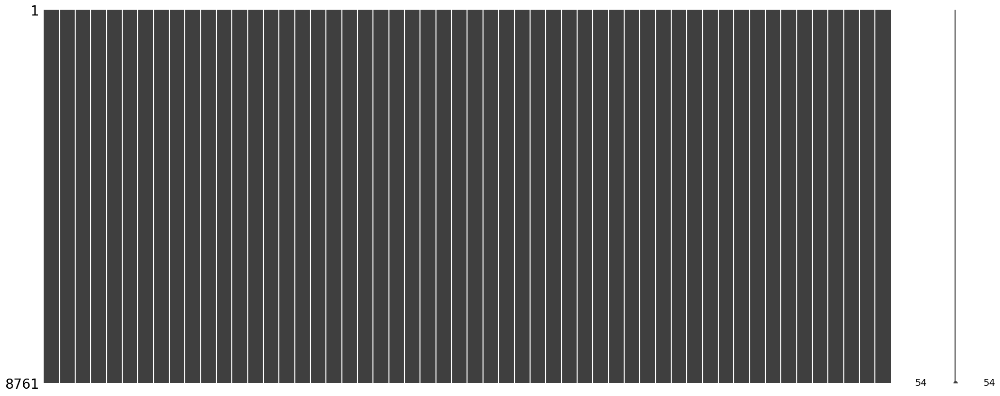

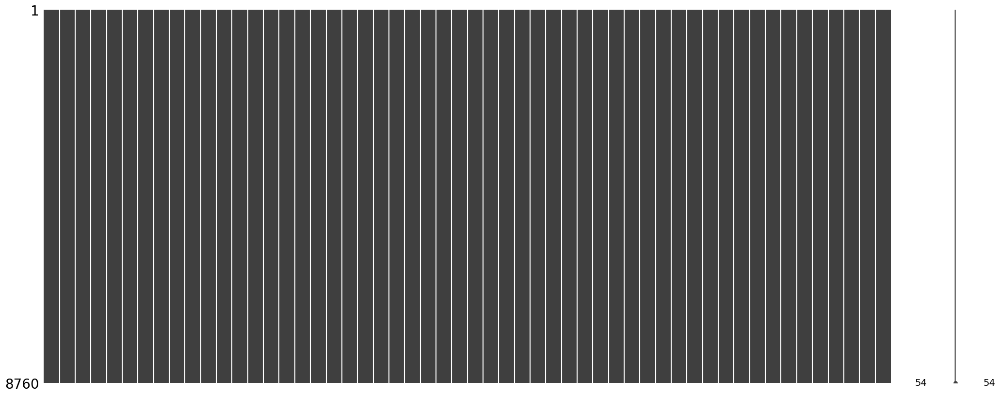

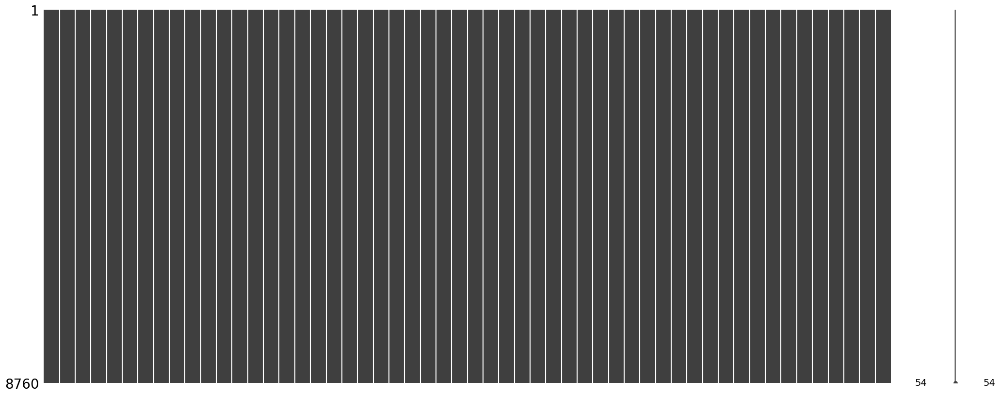

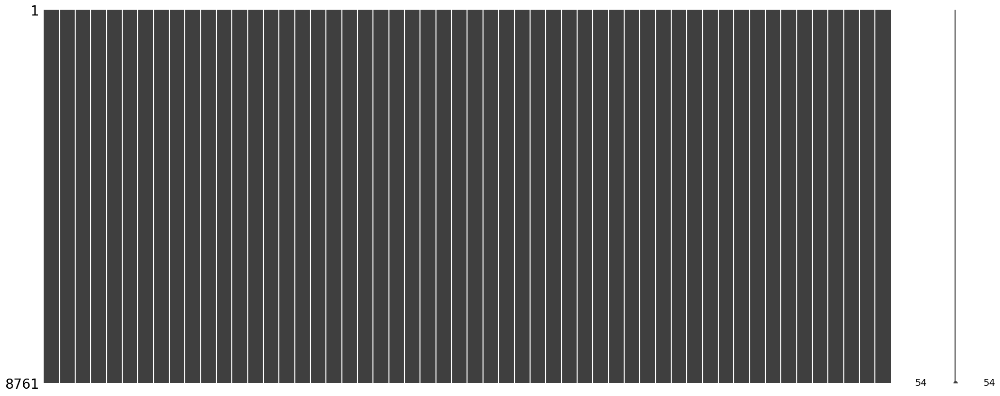

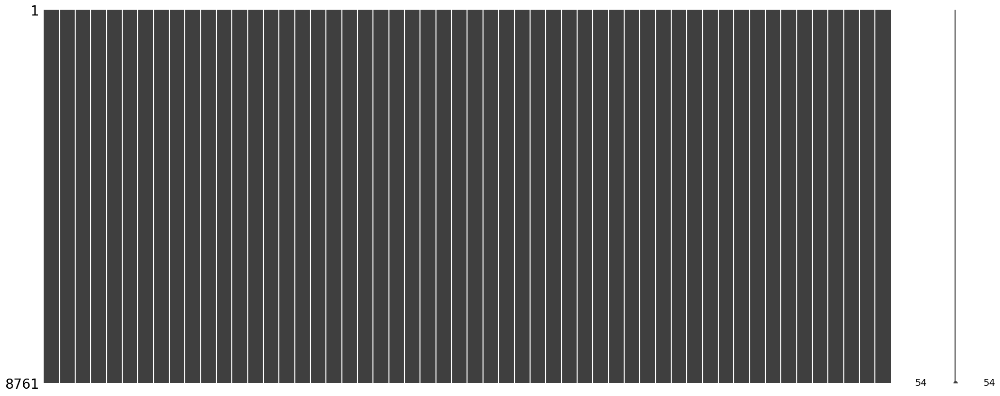

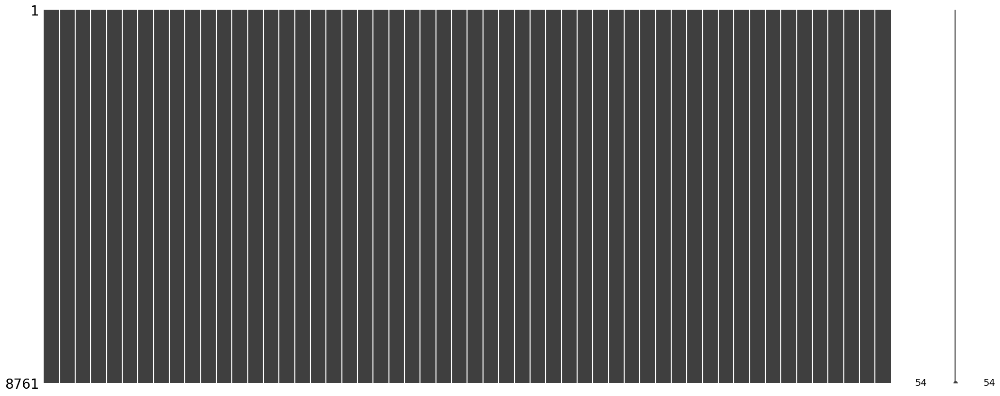

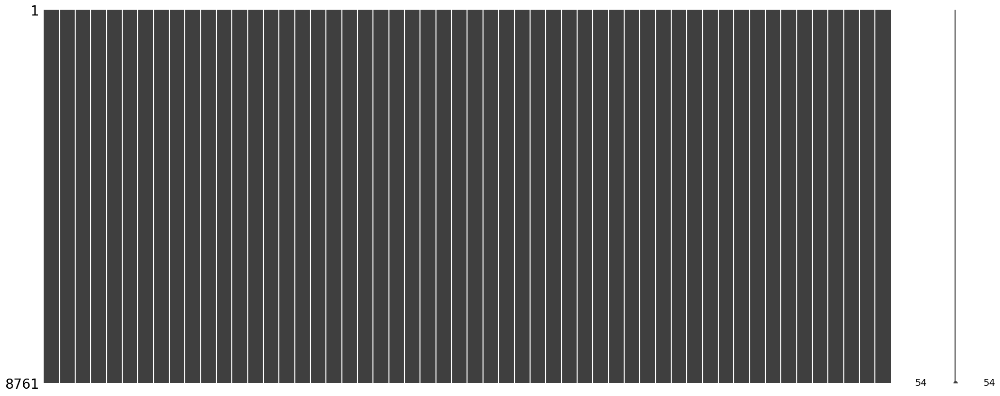

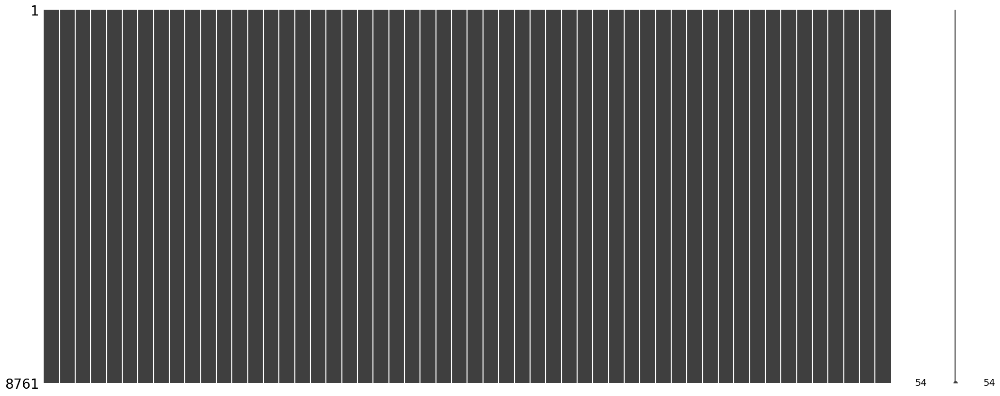

In [141]:
## 6-2 Example to use
file_path = r'C:\Users\LIE\MDA Project\Sound in Street\export_40\merged'
Missing_Count(file_path)

In [7]:
## 6-3 Read file and plot 2 independent variables against time
def plot_files_2var(file_path):
    import os
    import pandas as pd
    import matplotlib.pyplot as plt
    import plotly.express as px
    import plotly.graph_objects as go
    
    file_list = []
    for file in os.listdir(file_path):
        file_list.append(os.path.join(file_path, file))
    print(file_list)

    for file in file_list:
        df = pd.read_csv(file, low_memory=False)

        # Plot the filtered DataFrame
        title = os.path.basename(file)
        title = title.split('\\')[-1]
        # Remove the file extension
        title = os.path.splitext(title)[0]

        fig = go.Figure()
        fig.add_trace(go.Scatter(x=df['timestamp'], y=df['mean_lcpeak'], name='mean_lcpeak', line=dict(color='red')))
        fig.add_trace(go.Scatter(x=df['timestamp'], y=df['LC_HUMIDITY'], name='LC_HUMIDITY', line=dict(color='blue')))

        fig.update_layout(
            title=title,
            xaxis_title='Datetime',
            yaxis_title='Values'
        )

        fig.show()

In [9]:
## 6-3 Example to use
file_path = r'C:\Users\LIE\MDA Project\Sound in Street\export_40\merged'
plot_files_2var(file_path)

['C:\\Users\\LIE\\MDA Project\\Sound in Street\\export_40\\merged\\calvariekapel-_results_40_hour.csv', 'C:\\Users\\LIE\\MDA Project\\Sound in Street\\export_40\\merged\\naamsestraat-35_results_40_hour.csv', 'C:\\Users\\LIE\\MDA Project\\Sound in Street\\export_40\\merged\\naamsestraat-57_results_40_hour.csv', 'C:\\Users\\LIE\\MDA Project\\Sound in Street\\export_40\\merged\\naamsestraat-62_results_40_hour.csv', 'C:\\Users\\LIE\\MDA Project\\Sound in Street\\export_40\\merged\\naamsestraat-76_results_40_hour.csv', 'C:\\Users\\LIE\\MDA Project\\Sound in Street\\export_40\\merged\\naamsestraat-81_results_40_hour.csv', 'C:\\Users\\LIE\\MDA Project\\Sound in Street\\export_40\\merged\\parkstraat-2_results_40_hour.csv', 'C:\\Users\\LIE\\MDA Project\\Sound in Street\\export_40\\merged\\vrijthof_results_40_hour.csv']


In [122]:
# Plot 41 across year by month

import plotly.graph_objects as go

df_w41 = pd.read_csv(r'C:\Users\LIE\MDA Project\Sound in Street\export_41\To clean and train\To align with time\To join with weather\To concatenate\Export 41 adding weather information with no missing values for noise type classification\Export 41 and weather.csv')

# Group the data by year, month, and primary type to get the count
grouped_data_41 = df_w41.groupby(['month', 'noise_event_laeq_primary_detected_class']).size().reset_index(name='count')

# Create a dictionary to assign colors to each primary type
color_mapping = {
    'Transport road - Passenger car': 'rgb(10, 10, 10)',
    'Unsupported': 'rgb(127, 127, 127)',
    'Human voice - Shouting': 'rgb(255, 127, 14)',
    'Transport road - Siren': 'rgb(214, 39, 40)',
    'Human voice - Singing': 'rgb(227, 119, 194)',
    'Music non-amplified': 'rgb(140, 86, 75)',
    'Nature elements - Wind': 'rgb(188, 189, 34)',
    }

# Create a bar chart with different color segments for each primary type
fig = go.Figure()

for noise_type, color in color_mapping.items():
    data_subset = grouped_data_41[grouped_data_41['noise_event_laeq_primary_detected_class'] == noise_type]
    fig.add_trace(go.Bar(
        x=data_subset['month'],
        y=data_subset['count'],
        name=noise_type,
        marker_color=color
    ))

# Update the layout of the chart
fig.update_layout(
    title='Noise Type Count by Month, Leuven (2022)',
    xaxis_title='Month',
    yaxis_title='Types Count',
    barmode='stack'  # Set the bar mode to stack for different color segments
)

# Show the chart
fig.show()

In [123]:
# Plot 41 across year by weekday
df_w41 = pd.read_csv(r'C:\Users\LIE\MDA Project\Sound in Street\export_41\To clean and train\To align with time\To join with weather\To concatenate\Export 41 adding weather information with no missing values for noise type classification\Export 41 and weather.csv')

import plotly.graph_objects as go

# Group the data by year, month, and primary type to get the count
df_w41["datetime"] = pd.to_datetime(df_w41["datetime"], format="%Y-%m-%d %H:%M:%S")
df_w41["weekday"] = df_w41["datetime"].dt.strftime("%a")
grouped_data_41 = df_w41.groupby(['weekday', 'noise_event_laeq_primary_detected_class']).size().reset_index(name='count')

# Create a dictionary to assign colors to each primary type
color_mapping = {
    'Transport road - Passenger car': 'rgb(10, 10, 10)',
    'Unsupported': 'rgb(127, 127, 127)',
    'Human voice - Shouting': 'rgb(255, 127, 14)',
    'Transport road - Siren': 'rgb(214, 39, 40)',
    'Human voice - Singing': 'rgb(227, 119, 194)',
    'Music non-amplified': 'rgb(140, 86, 75)',
    'Nature elements - Wind': 'rgb(188, 189, 34)',
    }

# Create a bar chart with different color segments for each primary type
fig = go.Figure()

for noise_type, color in color_mapping.items():
    data_subset = grouped_data_41[grouped_data_41['noise_event_laeq_primary_detected_class'] == noise_type]
    fig.add_trace(go.Bar(
        x=data_subset['weekday'],
        y=data_subset['count'],
        name=noise_type,
        marker_color=color
    ))

fig.update_layout(
    title='Noise Type Count by Weekday, Leuven (2022)',
    xaxis_title='Weekday',
    yaxis_title='Types Count',
    barmode='stack',  # Set the bar mode to stack for different color segments
    xaxis=dict(categoryorder='array', categoryarray=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
)

# Show the chart
fig.show()

In [148]:
# Graph with different humidity by Month

import plotly.graph_objects as go
df_w41 = pd.read_csv(r'C:\Users\LIE\MDA Project\Sound in Street\export_41_test\withTime\addTimestamp\withWeather\concatenated\csv_results_41_280324_mp08bis---vrijthof_withTime_addTimestamp_withWeather_concatenated.csv')

# Filter the data based on Humidity>80 column values
df_w41_humidity_gt_80 = df_w41[df_w41['Humidity>80'] == 1]
df_w41_humidity_lt_80 = df_w41[df_w41['Humidity>80'] == 0]

# Group the data by month and noise type for Humidity>80 = 1
grouped_data_gt_80 = df_w41_humidity_gt_80.groupby(['month', 'noise_event_laeq_primary_detected_class']).size().reset_index(name='count_gt_80')

# Group the data by month and noise type for Humidity>80 = 0
grouped_data_lt_80 = df_w41_humidity_lt_80.groupby(['month', 'noise_event_laeq_primary_detected_class']).size().reset_index(name='count_lt_80')

# Create a dictionary to assign colors to each primary type
color_mapping = {
    'Transport road - Passenger car': 'rgb(10, 10, 10)',
    'Unsupported': 'rgb(127, 127, 127)',
    'Human voice - Shouting': 'rgb(255, 127, 14)',
    'Transport road - Siren': 'rgb(214, 39, 40)',
    'Human voice - Singing': 'rgb(227, 119, 194)',
    'Music non-amplified': 'rgb(140, 86, 75)',
    'Nature elements - Wind': 'rgb(188, 189, 34)',
}

# Create the first bar chart for Humidity>80 = 1
fig_gt_80 = go.Figure()

for noise_type, color in color_mapping.items():
    data_subset = grouped_data_gt_80[grouped_data_gt_80['noise_event_laeq_primary_detected_class'] == noise_type]
    fig_gt_80.add_trace(go.Bar(
        x=data_subset['month'],
        y=data_subset['count_gt_80'],
        name=noise_type,
        marker_color=color
    ))

# Update the layout of the first chart
fig_gt_80.update_layout(
    title='Noise Type Count by Month (Humidity>80)',
    xaxis_title='Month',
    yaxis_title='Types Count',
    barmode='stack'  # Set the bar mode to stack for different color segments
)

# Show the first chart
fig_gt_80.show()

# Create the second bar chart for Humidity>80 = 0
fig_lt_80 = go.Figure()

for noise_type, color in color_mapping.items():
    data_subset = grouped_data_lt_80[grouped_data_lt_80['noise_event_laeq_primary_detected_class'] == noise_type]
    fig_lt_80.add_trace(go.Bar(
        x=data_subset['month'],
        y=data_subset['count_lt_80'],
        name=noise_type,
        marker_color=color
    ))

# Update the layout of the second chart
fig_lt_80.update_layout(
    title='Noise Type Count by Month (Humidity<80)',
    xaxis_title='Month',
    yaxis_title='Types Count',
    barmode='stack'  # Set the bar mode to stack for different color segments
)

# Show the second chart
fig_lt_80.show()

In [149]:
# Graph with different humidity by Weekday

import plotly.graph_objects as go
df_w41 = pd.read_csv(r'C:\Users\LIE\MDA Project\Sound in Street\export_41_test\withTime\addTimestamp\withWeather\concatenated\csv_results_41_280324_mp08bis---vrijthof_withTime_addTimestamp_withWeather_concatenated.csv')

# Group the data by year, month, and primary type to get the count
df_w41["datetime"] = pd.to_datetime(df_w41["datetime"], format="%Y-%m-%d %H:%M:%S")
df_w41["weekday"] = df_w41["datetime"].dt.strftime("%a")

# Filter the data based on Humidity>80 column values
df_w41_humidity_gt_80 = df_w41[df_w41['Humidity>80'] == 1]
df_w41_humidity_lt_80 = df_w41[df_w41['Humidity>80'] == 0]

# Group the data by month and noise type for Humidity>80 = 1
grouped_data_gt_80 = df_w41_humidity_gt_80.groupby(['weekday', 'noise_event_laeq_primary_detected_class']).size().reset_index(name='count_gt_80')

# Group the data by month and noise type for Humidity>80 = 0
grouped_data_lt_80 = df_w41_humidity_lt_80.groupby(['weekday', 'noise_event_laeq_primary_detected_class']).size().reset_index(name='count_lt_80')

# Create a dictionary to assign colors to each primary type
color_mapping = {
    'Transport road - Passenger car': 'rgb(10, 10, 10)',
    'Unsupported': 'rgb(127, 127, 127)',
    'Human voice - Shouting': 'rgb(255, 127, 14)',
    'Transport road - Siren': 'rgb(214, 39, 40)',
    'Human voice - Singing': 'rgb(227, 119, 194)',
    'Music non-amplified': 'rgb(140, 86, 75)',
    'Nature elements - Wind': 'rgb(188, 189, 34)',
}

# Create the first bar chart for Humidity>80 = 1
fig_gt_80 = go.Figure()

for noise_type, color in color_mapping.items():
    data_subset = grouped_data_gt_80[grouped_data_gt_80['noise_event_laeq_primary_detected_class'] == noise_type]
    fig_gt_80.add_trace(go.Bar(
        x=data_subset['weekday'],
        y=data_subset['count_gt_80'],
        name=noise_type,
        marker_color=color
    ))

# Update the layout of the first chart
fig_gt_80.update_layout(
    title='Noise Type Count by Weekday (Humidity>80)',
    xaxis_title='Weekday',
    yaxis_title='Types Count',
    barmode='stack'  # Set the bar mode to stack for different color segments
)

# Show the first chart
fig_gt_80.show()

# Create the second bar chart for Humidity>80 = 0
fig_lt_80 = go.Figure()

for noise_type, color in color_mapping.items():
    data_subset = grouped_data_lt_80[grouped_data_lt_80['noise_event_laeq_primary_detected_class'] == noise_type]
    fig_lt_80.add_trace(go.Bar(
        x=data_subset['weekday'],
        y=data_subset['count_lt_80'],
        name=noise_type,
        marker_color=color
    ))

# Update the layout of the second chart
fig_lt_80.update_layout(
    title='Noise Type Count by Weekday (Humidity<80)',
    xaxis_title='Weekday',
    yaxis_title='Types Count',
    barmode='stack'  # Set the bar mode to stack for different color segments
)

# Show the second chart
fig_lt_80.show()

In [147]:
df_w41 = pd.read_csv(r'C:\Users\LIE\MDA Project\Sound in Street\export_41_test\withTime\addTimestamp\withWeather\csv_results_41_280324_mp08bis---vrijthof_withTime_addTimestamp_withWeather_concatenated.csv')


FileNotFoundError: [Errno 2] No such file or directory: 'C:\\Users\\LIE\\MDA Project\\Sound in Street\\export_41_test\\withTime\\addTimestamp\\withWeather\\csv_results_41_280324_mp08bis---vrijthof_withTime_addTimestamp_withWeather_concatenated.csv'

In [104]:
df_map.groupby(['latitude']).size().reset_index(name='count')

,latitude,count
0,50.873825,7616
1,50.874118,7615
2,50.874507,7617
3,50.875266,1832
4,50.875844,7836
5,50.876491,6962
6,50.877142,6962
7,50.878906,6255


In [105]:
df_map.groupby(['longitude']).size().reset_index(name='count')

,longitude,count
0,4.699911,7617
1,4.700003,1832
2,4.700014,7615
3,4.700118,7616
4,4.700203,7836
5,4.700713,6962
6,4.700724,6962
7,4.701187,6255


In [94]:
#測試AMS S3 => 失敗

import awswrangler as wr

raw_s3_bucket = 'mda-maindata'
raw_path_dir = 'preprocessed-data/40_laf/'
raw_df = f"s3://mda-maindata/preprocessed-data/40_laf/"
# raw_df = f"s3://{raw_s3_bucket}/{raw_path_dir}"
print(raw_df)
raw_df.shape

ModuleNotFoundError: No module named 'awswrangler'

In [73]:
# Using 8_Sites of noise imputed with weather ref, taking the average of the values by HOUR
file_plot = r'C:\Users\LIE\MDA Project\Sound in Street\export_40\merged\naamsestraat-76_results_40_hour.csv'
df_plot = pd.read_csv(file_plot)
# Plot the filtered DataFrame
title = os.path.basename(file_plot)
title = title.split('\\')[-1]
# Remove the file extension
title = os.path.splitext(title)[0]

fig = go.Figure()
fig.add_trace(go.Scatter(x=df_plot['datetime'], y=df_plot['mean_lcpeak'], name='mean_lcpeak', line=dict(color='red')))
fig.add_trace(go.Scatter(x=df_plot['datetime'], y=df_plot['LC_HUMIDITY'], name='LC_HUMIDITY', line=dict(color='blue')))

fig.update_layout(
    title=title,
    xaxis_title='Datetime',
    yaxis_title='Values'
)

fig.show()




Index(['datetime', 'description', 'year', 'month', 'day', 'hour', 'weekday',
       '10min', 'mean_lamax', 'mean_laeq', 'mean_lceq', 'mean_lcpeak',
       'DATEUTC', 'LC_HUMIDITY', 'LC_DWPTEMP', 'LC_n', 'LC_RAD', 'LC_RAININ',
       'LC_DAILYRAIN', 'LC_WINDDIR', 'LC_WINDSPEED', 'LC_RAD60',
       'LC_TEMP_QCL0', 'LC_TEMP_QCL1', 'LC_TEMP_QCL2', 'LC_TEMP_QCL3'],
      dtype='object')


In [33]:
# Example usage
file_path_1 = r'C:\Users\LIE\MDA Project\Sound in Street\8_Sites of noise imputed with weather ref'
file_path_2 = r'C:\Users\LIE\MDA Project\Sound in Street\export_40'
type(file_path_1)
generate_new_file(file_path_1, file_path_2)

AttributeError: 'str' object has no attribute 'append'

In [4]:
df2 = pd.read_csv(r'C:\Users\LIE\MDA Project\Sound in Street\export_40\calvariekapel-_results_40.csv', delimiter=';')
df2['result_timestamp'] = pd.to_datetime(df2['result_timestamp'], format='%d/%m/%Y %H:%M:%S.%f')
# create new columns for year, month, day, hour
df2['year']  = df2['result_timestamp'].dt.year
df2['month'] = df2['result_timestamp'].dt.month
df2['day'] = df2['result_timestamp'].dt.day
df2['hour'] = df2['result_timestamp'].dt.hour
print(df2)

# merged_df = pd.merge(df2, df, how='outer', on=['year','month','day','hour'])

# new_file_path = file[:-4]+'_hour.csv'
# merged_df.to_csv(new_file_path, index=False)

      #object_id                     description    result_timestamp  \
0         255442  MP 05: Calvariekapel KU Leuven 2022-02-17 16:00:00   
1         255442  MP 05: Calvariekapel KU Leuven 2022-02-17 17:00:00   
2         255442  MP 05: Calvariekapel KU Leuven 2022-02-17 18:00:00   
3         255442  MP 05: Calvariekapel KU Leuven 2022-02-17 19:00:00   
4         255442  MP 05: Calvariekapel KU Leuven 2022-02-17 20:00:00   
...          ...                             ...                 ...   
7609      255442  MP 05: Calvariekapel KU Leuven 2022-12-31 19:00:00   
7610      255442  MP 05: Calvariekapel KU Leuven 2022-12-31 20:00:00   
7611      255442  MP 05: Calvariekapel KU Leuven 2022-12-31 21:00:00   
7612      255442  MP 05: Calvariekapel KU Leuven 2022-12-31 22:00:00   
7613      255442  MP 05: Calvariekapel KU Leuven 2022-12-31 23:00:00   

      laf005_per_hour laf005_per_hour_unit  laf01_per_hour  \
0                72.6                dB(A)            70.9   
1          

In [38]:
## 可以運作，但是迴圈數目不對

import os
import pandas as pd
from datetime import datetime

def generate_new_file(file_path_1, file_path_2):
    file_list_1 = []
    for file1 in os.listdir(file_path_1):
        file_list_1.append(os.path.join(file_path_1, file1))
    print(file_list_1)
    
    file_list_2 = []
    for file2 in os.listdir(file_path_2):
        file_list_2.append(os.path.join(file_path_2, file2))
    print(file_list_2)
    
    merged_folder = os.path.join(file_path_2, 'merged')  # New folder path
    os.makedirs(merged_folder, exist_ok=True)  # Create the 'merged' folder if it doesn't exist
    
    for file in file_list_1:
        # Read Files.
        df = pd.read_csv(file)

        new_df = df.groupby([
            df['description'],
            df['year'],
            df['month'],        
            df['day'],
            df['weekday'],
            df['hour']])[['mean_lamax', 'mean_laeq', 'mean_lceq', 'mean_lcpeak',
                'LC_HUMIDITY', 'LC_DWPTEMP', 'LC_n', 'LC_RAD', 'LC_RAININ',
                'LC_DAILYRAIN', 'LC_WINDDIR', 'LC_WINDSPEED', 'LC_RAD60',
                'LC_TEMP_QCL0', 'LC_TEMP_QCL1', 'LC_TEMP_QCL2', 'LC_TEMP_QCL3']].mean().reset_index()
    
        # Rename the columns
        new_df.columns = ['description', 'year', 'month', 'day', 'weekday', 'hour', 
                            'mean_lamax', 'mean_laeq', 'mean_lceq', 'mean_lcpeak',
                            'LC_HUMIDITY', 'LC_DWPTEMP', 'LC_n', 'LC_RAD', 'LC_RAININ',
                            'LC_DAILYRAIN', 'LC_WINDDIR', 'LC_WINDSPEED', 'LC_RAD60',
                            'LC_TEMP_QCL0', 'LC_TEMP_QCL1', 'LC_TEMP_QCL2', 'LC_TEMP_QCL3']
        for file2 in file_list_2:
            # Read Files.
            df2 = pd.read_csv(file2, delimiter=';')
            df2['result_timestamp'] = pd.to_datetime(df2['result_timestamp'], format='%d/%m/%Y %H:%M:%S.%f')
            # create new columns for year, month, day, hour
            df2['year']  = df2['result_timestamp'].dt.year
            df2['month'] = df2['result_timestamp'].dt.month
            df2['day'] = df2['result_timestamp'].dt.day
            df2['hour'] = df2['result_timestamp'].dt.hour
            merged_df = pd.merge(new_df, df2, how='outer', on=['year','month','day','hour'])
            
            # Construct the new file path within the 'merged' folder
            file_name = os.path.basename(file2)
            new_file_path = os.path.join(merged_folder, file_name[:-4]+'_hour.csv')
            merged_df.to_csv(new_file_path, index=False)